In [39]:
filename = '/global/cfs/cdirs/dune/www/data/2x2/'
filename += 'nearline/flowed_light/data_bin004/'
filename += 'mpd_run_hvramp_rctl_105_p10.FLOW.hdf5'

print(filename)


units = 'ADC16'
#units = 'ADC14'
#units = 'V'

# beam vs non-beam
beam_only = True
self_trig = False

/global/cfs/cdirs/dune/www/data/2x2/nearline/flowed_light/data_bin004/mpd_run_hvramp_rctl_105_p10.FLOW.hdf5


In [40]:
import numpy as np
import pandas as pd
import matplotlib
import h5py, glob, argparse
import matplotlib.pyplot as plt
from matplotlib.axes import Axes
from scipy.fft import rfft, rfftfreq
import matplotlib as mpl
import matplotlib.gridspec as gridspec
from matplotlib import cm, colors
import matplotlib.patches as mpatches
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator, FixedLocator)
from matplotlib.colors import LogNorm
from datetime import datetime
from matplotlib.backends.backend_pdf import PdfPages
import json
from scipy.stats import beta

In [41]:
## define system constants ##
SAMPLE_RATE = 0.016 # us
SAMPLES = 1000      # samples per waveform
adc14_max = 8191  # max ADC14 counts
adc14_16 = 2**2             # factor (14-bit ADC to 16-bit integer)

ADC_V_range = 2.0 # (or 5)
ADC_V_offset = -1.0 # (or -2.5)

def adc16_to_voltage(adc_counts, mask=None):
    print(adc_counts.shape)
    if mask is not None:
        print(mask.shape)
        adc_counts = np.where(mask[..., np.newaxis], adc_counts, 0)
    return adc_counts * (ADC_V_range + ADC_V_offset) / (adc14_max * adc14_16)

# set peak to peak range per ADC
ptps_16 = np.array([150]*8)
ptps_14 = ptps_16 / adc14_16
ptps_V = ptps_16 * (ADC_V_range) / (adc14_max * adc14_16)

if units == 'ADC16':
    ptps = ptps_16
elif units == 'ADC14':
    ptps = ptps_14
elif units == 'V':
    ptps = ptps_V

# channels (0-63, skipping first 4, then include next 12, repeat)
channels = []
for group_start in range(0, 64, 16):
  channels.extend(range(group_start + 4, min(group_start + 16, 64)))

In [42]:
# import channel status as pd dataframe and convert to numpy array
channel_status_csv = '../lrs_sanity_check/channel_status/channel_status.csv'
cs_df = pd.read_csv(channel_status_csv, header=None)
cs = cs_df.to_numpy()

In [43]:
#import calib
calib_filename = '../lrs_sanity_check/calibration/data_calib.csv'
calib_df = pd.read_csv(calib_filename, header=None)
calib = calib_df.to_numpy()

(5, 8, 64)
(5,)


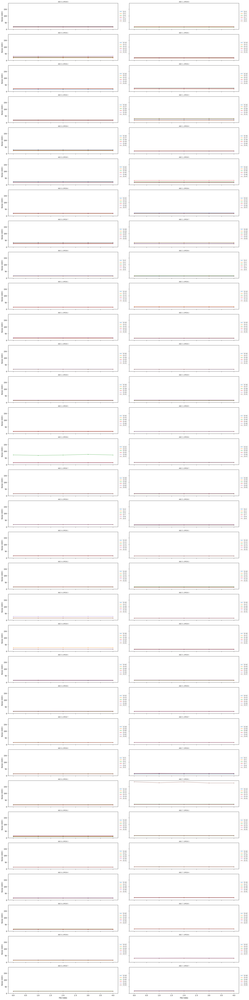

In [44]:
def plot_noise_grid(noisy_arr, channels, file_indices):
    n_adc = noisy_arr.shape[1]  # 8
    n_epcb = len(channels) // 6
    n_rows = int(n_adc // 2 * n_epcb)
    fig, axes = plt.subplots(n_rows, 2, figsize=(20, 2.5 * n_rows), sharex=True, sharey=True)
    if n_rows == 1:
        axes = axes[np.newaxis, :]
    for adc_idx in range(n_adc):
        for epcb_idx in range(n_epcb):
            col = 0 if adc_idx % 2 == 0 else 1  # even ADC left, odd right
            row = adc_idx // 2 * n_epcb + epcb_idx
            ax = axes[row, col]
            ch_start = epcb_idx * 6
            ch_end = (epcb_idx + 1) * 6
            epcb_channels = channels[ch_start:ch_end]
            lines = []
            labels = []
            for ch in epcb_channels:
                # ch is the channel index (0-63), but axis 2 of noisy_arr is channel
                # So we want to plot noisy_arr[:, adc_idx, ch] (shape: N_files)
                noise_vals = noisy_arr[:, adc_idx, ch]
                if np.isscalar(noise_vals) or np.shape(noise_vals) == ():
                    noise_vals = np.full_like(file_indices, noise_vals, dtype=float)
                elif np.ndim(noise_vals) == 0:
                    noise_vals = np.full_like(file_indices, noise_vals, dtype=float)
                elif len(noise_vals) != len(file_indices):
                    if len(noise_vals) == 1:
                        noise_vals = np.full_like(file_indices, noise_vals[0], dtype=float)
                    else:
                        continue
                line, = ax.plot(file_indices, noise_vals, marker='o', label=f'Ch {ch}', markersize=2, linewidth=1)
                lines.append(line)
                labels.append(f'Ch {ch}')
            ax.set_title(f'ADC {adc_idx}, EPCB {epcb_idx}', fontsize=8)
            ax.grid(False)
            if col == 0:
                ax.set_ylabel('Noise (ADC)')
            if row == n_rows - 1:
                ax.set_xlabel('File Index')
            # Add legend to the right of each subplot
            if lines:
                ax.legend(lines, labels, fontsize='x-small', loc='center left', bbox_to_anchor=(1.01, 0.5), borderaxespad=0.)
    plt.tight_layout()
    plt.show()
    return fig


dqm_json_filename = 'dqm_plots/noises.json'

with open(dqm_json_filename, 'r') as f:
    dqm_data_list = [json.loads(line) for line in f if line.strip()]

# Stack all 'data_c' arrays (each 8x64) into one array of shape (N, 8, 64)
noise_arr = np.stack([np.array(dqm_data['data_c']) for dqm_data in dqm_data_list])
print(noise_arr.shape)
file_indices = np.array([dqm_data['file_index'] for dqm_data in dqm_data_list])
print(file_indices.shape)

fig = plot_noise_grid(noise_arr, channels, file_indices)

(5, 8, 64)
(5,)


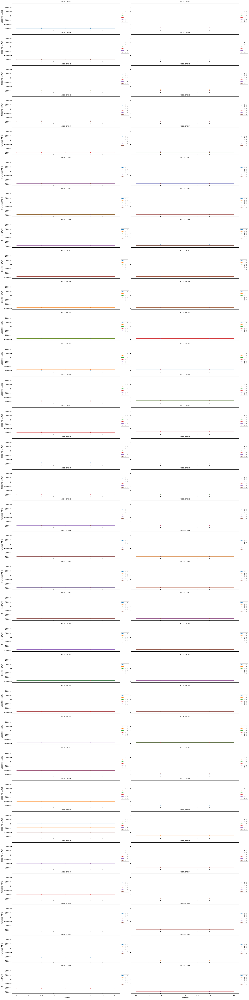

In [45]:
def plot_baseline_grid(baseline_arr, channels, file_indices):
  n_adc = baseline_arr.shape[1]  # 8
  n_epcb = len(channels) // 6
  n_rows = int(n_adc // 2 * n_epcb)
  fig, axes = plt.subplots(n_rows, 2, figsize=(20, 2.5 * n_rows), sharex=True, sharey=True)
  if n_rows == 1:
    axes = axes[np.newaxis, :]
  for adc_idx in range(n_adc):
    for epcb_idx in range(n_epcb):
      col = 0 if adc_idx % 2 == 0 else 1
      row = adc_idx // 2 * n_epcb + epcb_idx
      ax = axes[row, col]
      ch_start = epcb_idx * 6
      ch_end = (epcb_idx + 1) * 6
      epcb_channels = channels[ch_start:ch_end]
      lines = []
      labels = []
      for ch in epcb_channels:
        baseline_vals = baseline_arr[:, adc_idx, ch]
        if np.isscalar(baseline_vals) or np.shape(baseline_vals) == ():
          baseline_vals = np.full_like(file_indices, baseline_vals, dtype=float)
        elif np.ndim(baseline_vals) == 0:
          baseline_vals = np.full_like(file_indices, baseline_vals, dtype=float)
        elif len(baseline_vals) != len(file_indices):
          if len(baseline_vals) == 1:
            baseline_vals = np.full_like(file_indices, baseline_vals[0], dtype=float)
          else:
            continue
        line, = ax.plot(file_indices, baseline_vals, marker='o', label=f'Ch {ch}', markersize=2, linewidth=1)
        lines.append(line)
        labels.append(f'Ch {ch}')
      ax.set_title(f'ADC {adc_idx}, EPCB {epcb_idx}', fontsize=8)
      ax.grid(False)
      if col == 0:
        ax.set_ylabel('Baseline (ADC)')
      if row == n_rows - 1:
        ax.set_xlabel('File Index')
      if lines:
        ax.legend(lines, labels, fontsize='x-small', loc='center left', bbox_to_anchor=(1.01, 0.5), borderaxespad=0.)
  plt.tight_layout()
  plt.show()
  return fig



dqm_json_filename = 'dqm_plots/baselines.json'

with open(dqm_json_filename, 'r') as f:
    dqm_data_list = [json.loads(line) for line in f if line.strip()]

# Stack all 'data_l' arrays (each 8x64) into one array of shape (N, 8, 64)
baseline_arr = np.stack([np.array(dqm_data['data_c']) for dqm_data in dqm_data_list])
print(baseline_arr.shape)
file_indices = np.array([dqm_data['file_index'] for dqm_data in dqm_data_list])
print(file_indices.shape)

fig = plot_baseline_grid(baseline_arr, channels, file_indices)


/tmp/ipykernel_1116325/319078355.py:52: RuntimeWarning: invalid value encountered in divide
  clipped_arr = 100* clipped_arr_pass / clipped_arr_total


(5,)


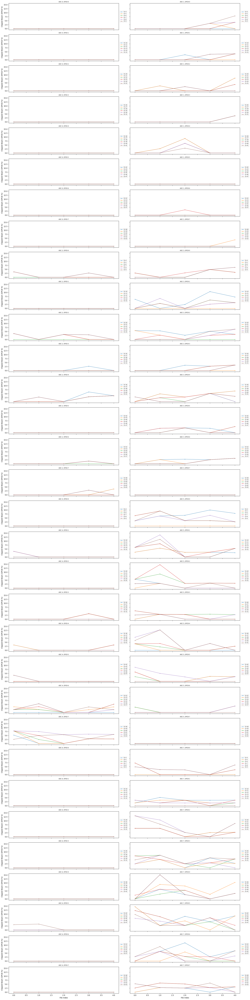

In [46]:
def plot_clipped_grid(clipped_arr, channels, file_indices):
  n_adc = clipped_arr.shape[1]  # 8
  n_epcb = len(channels) // 6
  n_rows = int(n_adc // 2 * n_epcb)
  fig, axes = plt.subplots(n_rows, 2, figsize=(20, 2.5 * n_rows), sharex=True, sharey=True)
  if n_rows == 1:
    axes = axes[np.newaxis, :]
  for adc_idx in range(n_adc):
    for epcb_idx in range(n_epcb):
      col = 0 if adc_idx % 2 == 0 else 1
      row = adc_idx // 2 * n_epcb + epcb_idx
      ax = axes[row, col]
      ch_start = epcb_idx * 6
      ch_end = (epcb_idx + 1) * 6
      epcb_channels = channels[ch_start:ch_end]
      lines = []
      labels = []
      for ch in epcb_channels:
        clipped_vals = clipped_arr[:, adc_idx, ch]
        if np.isscalar(clipped_vals) or np.shape(clipped_vals) == ():
          clipped_vals = np.full_like(file_indices, clipped_vals, dtype=float)
        elif np.ndim(clipped_vals) == 0:
          clipped_vals = np.full_like(file_indices, clipped_vals, dtype=float)
        elif len(clipped_vals) != len(file_indices):
          if len(clipped_vals) == 1:
            clipped_vals = np.full_like(file_indices, clipped_vals[0], dtype=float)
          else:
            continue
        line, = ax.plot(file_indices, clipped_vals, marker='o', label=f'Ch {ch}', markersize=2, linewidth=1)
        lines.append(line)
        labels.append(f'Ch {ch}')
      ax.set_title(f'ADC {adc_idx}, EPCB {epcb_idx}', fontsize=8)
      ax.grid(False)
      if col == 0:
        ax.set_ylabel('Clipped Beam (EPCB %)')
      if row == n_rows - 1:
        ax.set_xlabel('File Index')
      if lines:
        ax.legend(lines, labels, fontsize='x-small', loc='center left', bbox_to_anchor=(1.01, 0.5), borderaxespad=0.)
  plt.tight_layout()
  plt.show()
  return fig

dqm_json_filename = 'dqm_plots/clipped_epcb_beam.json'

with open(dqm_json_filename, 'r') as f:
    dqm_data_list = [json.loads(line) for line in f if line.strip()]

# Stack all 'data_l' arrays (each 8x64) into one array of shape (N, 8, 64)
clipped_arr_pass = np.stack([np.array(dqm_data['pass']) for dqm_data in dqm_data_list])
clipped_arr_total = np.stack([np.array(dqm_data['totals']) for dqm_data in dqm_data_list])
clipped_arr = 100* clipped_arr_pass / clipped_arr_total
file_indices = np.array([dqm_data['file_index'] for dqm_data in dqm_data_list])
print(file_indices.shape)

fig = plot_clipped_grid(clipped_arr, channels, file_indices)


/tmp/ipykernel_1116325/308176414.py:51: RuntimeWarning: invalid value encountered in divide
  negatives_arr = 100 * negatives_arr_pass / negatives_arr_total


(5,)


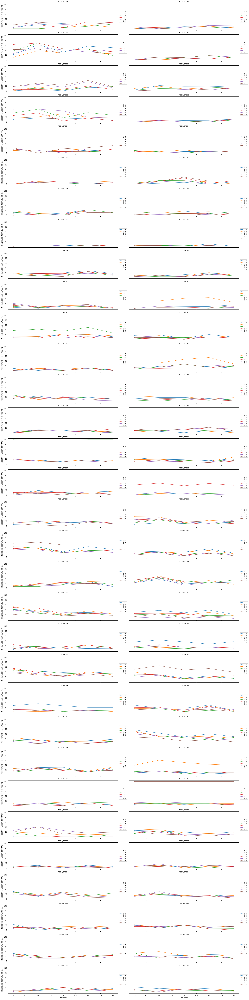

In [47]:
def plot_negative_spikes_grid(clipped_arr, channels, file_indices):
  n_adc = clipped_arr.shape[1]  # 8
  n_epcb = len(channels) // 6
  n_rows = int(n_adc // 2 * n_epcb)
  fig, axes = plt.subplots(n_rows, 2, figsize=(20, 2.5 * n_rows), sharex=True, sharey=True)
  if n_rows == 1:
    axes = axes[np.newaxis, :]
  for adc_idx in range(n_adc):
    for epcb_idx in range(n_epcb):
      col = 0 if adc_idx % 2 == 0 else 1
      row = adc_idx // 2 * n_epcb + epcb_idx
      ax = axes[row, col]
      ch_start = epcb_idx * 6
      ch_end = (epcb_idx + 1) * 6
      epcb_channels = channels[ch_start:ch_end]
      lines = []
      labels = []
      for ch in epcb_channels:
        clipped_vals = clipped_arr[:, adc_idx, ch]
        if np.isscalar(clipped_vals) or np.shape(clipped_vals) == ():
          clipped_vals = np.full_like(file_indices, clipped_vals, dtype=float)
        elif np.ndim(clipped_vals) == 0:
          clipped_vals = np.full_like(file_indices, clipped_vals, dtype=float)
        elif len(clipped_vals) != len(file_indices):
          if len(clipped_vals) == 1:
            clipped_vals = np.full_like(file_indices, clipped_vals[0], dtype=float)
          else:
            continue
        line, = ax.plot(file_indices, clipped_vals, marker='o', label=f'Ch {ch}', markersize=2, linewidth=1)
        lines.append(line)
        labels.append(f'Ch {ch}')
      ax.set_title(f'ADC {adc_idx}, EPCB {epcb_idx}', fontsize=8)
      ax.grid(False)
      if col == 0:
        ax.set_ylabel('Negatives Beam (EPCB %)')
      if row == n_rows - 1:
        ax.set_xlabel('File Index')
      if lines:
        ax.legend(lines, labels, fontsize='x-small', loc='center left', bbox_to_anchor=(1.01, 0.5), borderaxespad=0.)
  plt.tight_layout()
  plt.show()
  return fig

dqm_json_filename = 'dqm_plots/negatives_epcb_beam.json'

with open(dqm_json_filename, 'r') as f:
    dqm_data_list = [json.loads(line) for line in f if line.strip()]

negatives_arr_pass = np.stack([np.array(dqm_data['pass']) for dqm_data in dqm_data_list])
negatives_arr_total = np.stack([np.array(dqm_data['totals']) for dqm_data in dqm_data_list])
negatives_arr = 100 * negatives_arr_pass / negatives_arr_total
file_indices = np.array([dqm_data['file_index'] for dqm_data in dqm_data_list])
print(file_indices.shape)

fig = plot_negative_spikes_grid(negatives_arr, channels, file_indices)


(5, 8, 64)
(5,)


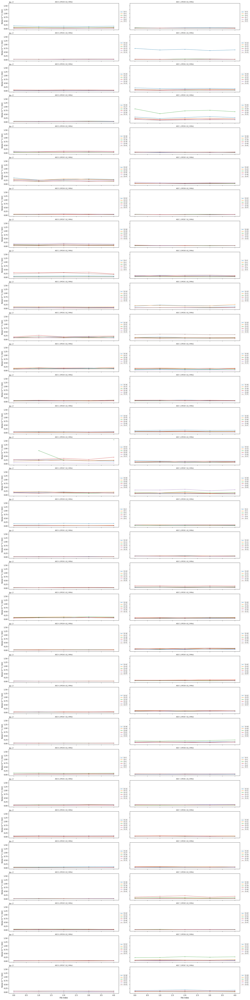

(5, 8, 64)
(5,)


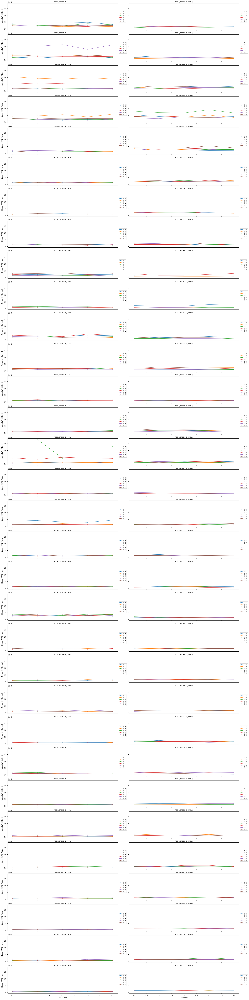

(5, 8, 64)
(5,)


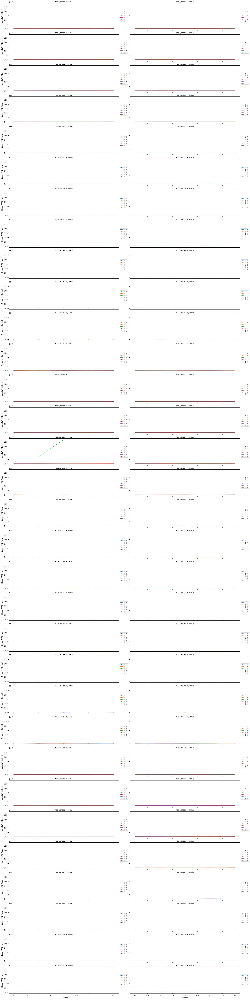

(5, 8, 64)
(5,)


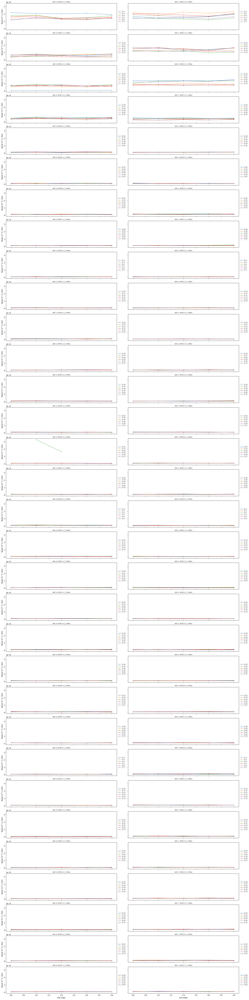

(5, 8, 64)
(5,)


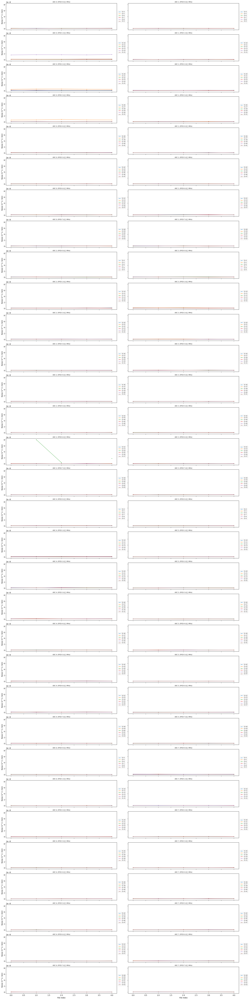

(5, 8, 64)
(5,)


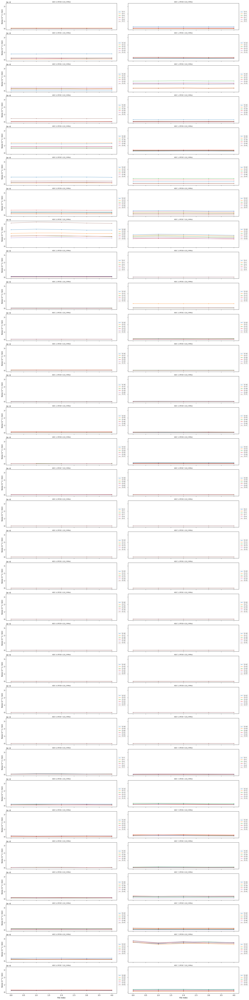

(5, 8, 64)
(5,)


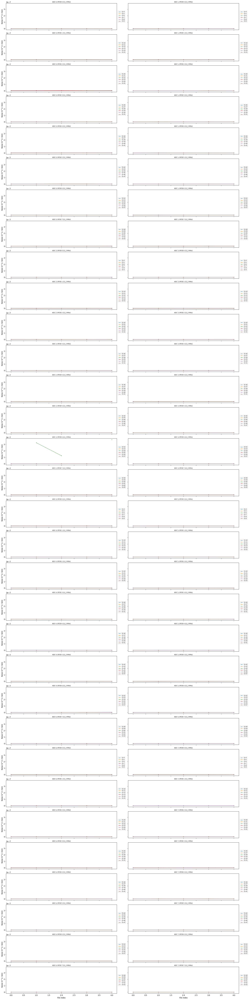

(5, 8, 64)
(5,)


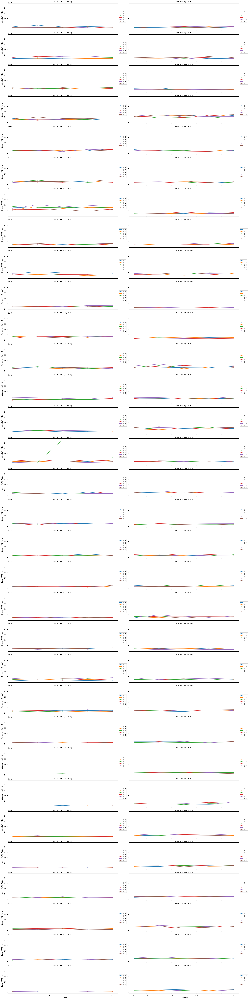

(5, 8, 64)
(5,)


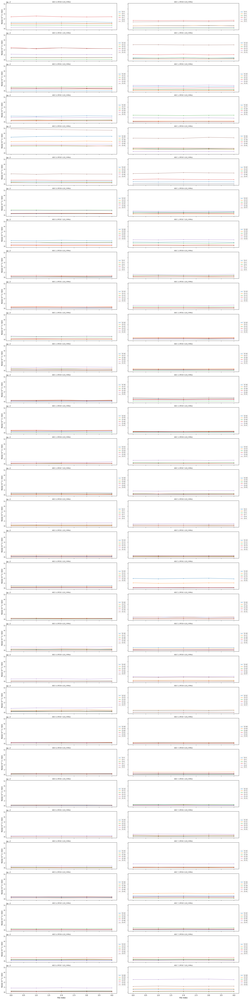

(5, 8, 64)
(5,)


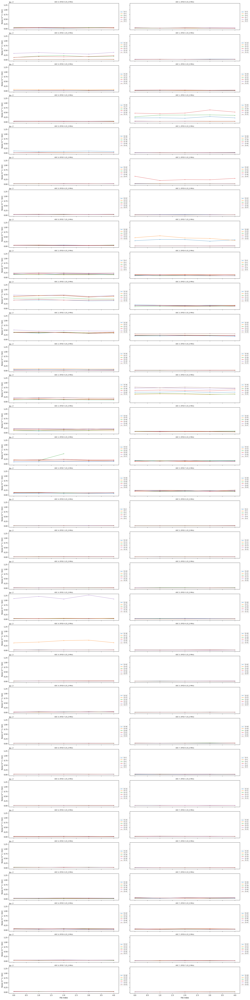

(5, 8, 64)
(5,)


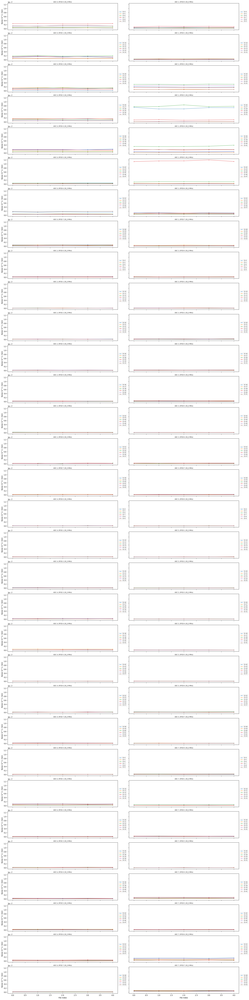

In [48]:
def plot_noise_spectra_rois(noise_arr, channels, file_indices, roi_mhz):
    n_adc = noise_arr.shape[1]  # 8
    n_epcb = len(channels) // 6
    n_rows = int(n_adc // 2 * n_epcb)
    fig, axes = plt.subplots(n_rows, 2, figsize=(20, 2.5 * n_rows), sharex=True, sharey=True)
    if n_rows == 1:
        axes = axes[np.newaxis, :]
    for adc_idx in range(n_adc):
        for epcb_idx in range(n_epcb):
            col = 0 if adc_idx % 2 == 0 else 1
            row = adc_idx // 2 * n_epcb + epcb_idx
            ax = axes[row, col]
            ch_start = epcb_idx * 6
            ch_end = (epcb_idx + 1) * 6
            epcb_channels = channels[ch_start:ch_end]
            lines = []
            labels = []
            for ch in epcb_channels:
                noise_vals = noise_arr[:, adc_idx, ch]
                if np.isscalar(noise_vals) or np.shape(noise_vals) == ():
                    noise_vals = np.full_like(file_indices, noise_vals, dtype=float)
                elif np.ndim(noise_vals) == 0:
                    noise_vals = np.full_like(file_indices, noise_vals, dtype=float)
                elif len(noise_vals) != len(file_indices):
                    if len(noise_vals) == 1:
                        noise_vals = np.full_like(file_indices, noise_vals[0], dtype=float)
                    else:
                        continue
                line, = ax.plot(file_indices, noise_vals, marker='o', label=f'Ch {ch}', markersize=2, linewidth=1)
                lines.append(line)
                labels.append(f'Ch {ch}')
            ax.set_title(f'ADC {adc_idx}, EPCB {epcb_idx} ({roi_mhz} MHz)', fontsize=8)
            ax.grid(False)
            if col == 0:
                ax.set_ylabel('Noise (V^2 / bin)')
            if row == n_rows - 1:
                ax.set_xlabel('File Index')
            if lines:
                ax.legend(lines, labels, fontsize='x-small', loc='center left', bbox_to_anchor=(1.01, 0.5), borderaxespad=0.)
    plt.tight_layout()
    plt.show()
    return fig

rois_mhz = np.array([0.5, 1.8, 4.6, 7.1, 8.5, 10, 11.5, 19, 20, 25, 30])

# loop over rois_mhz and plot 'noise_spectra_roi_{roi_mhz}mhz.json'

for i,_ in enumerate(rois_mhz):
    roi_mhz = str(rois_mhz[i]).replace('.', '_')
    dqm_json_filename = f'dqm_plots/noise_spectra_roi_{roi_mhz}mhz.json'

    with open(dqm_json_filename, 'r') as f:
        dqm_data_list = [json.loads(line) for line in f if line.strip()]

    # Stack all 'data_c' arrays (each 8x64) into one array of shape (N, 8, 64)
    noise_arr = np.stack([np.array(dqm_data['spectra_roi']) for dqm_data in dqm_data_list])
    print(noise_arr.shape)
    file_indices = np.array([dqm_data['file_index'] for dqm_data in dqm_data_list])
    print(file_indices.shape)

    fig = plot_noise_spectra_rois(noise_arr, channels, file_indices, roi_mhz)